### **Imports**

In [2]:
import os
import cv2
import numpy as np
import mediapipe as mp
from tqdm import tqdm
import zipfile
import os
import shutil
import pandas as pd
import random
from glob import glob
from collections import defaultdict
import imgaug.augmenters as iaa
import imageio.v3 as iio
from glob import glob
import matplotlib.pyplot as plt

### **Unzip ExpW Dataset**

In [5]:
zip_path = r"D:\Downloads\archive.zip"
extract_dir = r"D:\ExpW_dataset"

# Unzip archive
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print("Unzipped to:", extract_dir)

Unzipped to: D:\ExpW_dataset


### **Cropping Faces and Classifying**

In [18]:
label_path = os.path.join(extract_dir, "label.lst")
origin_dir = os.path.join(extract_dir, "origin")
output_image_dir = os.path.join(extract_dir, "images_cropped_224")

os.makedirs(output_image_dir, exist_ok=True)

In [19]:
# Expression labels
expression_map = {
    "0": "angry", "1": "disgust", "2": "fear",
    "3": "happy", "4": "sad", "5": "surprise", "6": "neutral"
}

# Read label.lst
with open(label_path, 'r') as f:
    lines = f.readlines()

# Process each entry
for line in tqdm(lines, desc="Cropping faces"):
    parts = line.strip().split()
    if len(parts) < 8:
        continue

    img_name, face_id_in_image, top, left, right, bottom, conf, label = parts
    label_name = expression_map.get(label)

    if label_name is None:
        continue

    img_path = os.path.join(origin_dir, img_name)
    out_dir = os.path.join(output_image_dir, label_name)
    os.makedirs(out_dir, exist_ok=True)

    try:
        img = cv2.imread(img_path)
        if img is None:
            print(f"Image not found or unreadable: {img_path}")
            continue

        # Convert coordinates to int
        top, left, right, bottom = map(int, [top, left, right, bottom])

        # Basic bounds checking
        h, w = img.shape[:2]
        top = max(0, min(top, h))
        bottom = max(0, min(bottom, h))
        left = max(0, min(left, w))
        right = max(0, min(right, w))

        # Ensure coordinates make sense
        if right <= left or bottom <= top:
            print(f"Invalid bounding box in {img_name} - skipped")
            continue

        face = img[top:bottom, left:right]

        if face.size == 0:
            print(f"Empty face crop in {img_name} - skipped")
            continue

        face = cv2.resize(face, (224, 224))
        save_path = os.path.join(out_dir, os.path.basename(img_name))
        cv2.imwrite(save_path, face)
    except Exception as e:
        print("Error with", img_name, ":", str(e))


Cropping faces: 100%|██████████| 91793/91793 [36:44<00:00, 41.63it/s]    


### **Data Augmentation to mitigate Class Imbalance**

In [27]:
base_dir = r"D:\ExpW_dataset\images_cropped_224"
target_total = 150000

In [28]:
# 1. Count images per class
class_counts = {}
for emotion in os.listdir(base_dir):
    emotion_dir = os.path.join(base_dir, emotion)
    images = glob(os.path.join(emotion_dir, "*.jpg"))
    class_counts[emotion] = len(images)

# 2. Determine how many images each class should have
num_classes = len(class_counts)
target_per_class = target_total // num_classes
augmentation_plan = {cls: max(0, target_per_class - count) for cls, count in class_counts.items()}

# 3. Augment only needed classes
aug = iaa.Sequential([
    iaa.Fliplr(0.5),
    iaa.Affine(rotate=(-20, 20)),
    iaa.GaussianBlur(sigma=(0.0, 1.0)),
    iaa.AdditiveGaussianNoise(scale=(5, 15)),
    iaa.LinearContrast((0.75, 1.5)),
])

print("Augmenting underrepresented classes...")
for emotion, num_to_add in augmentation_plan.items():
    if num_to_add <= 0:
        continue

    emotion_dir = os.path.join(base_dir, emotion)
    images = glob(os.path.join(emotion_dir, "*.jpg"))
    for _ in tqdm(range(num_to_add), desc=f"Augmenting {emotion}"):
        img_path = random.choice(images)
        image = iio.imread(img_path)
        augmented = aug(image=image)
        new_name = f"aug_{random.randint(100000, 999999)}.jpg"
        iio.imwrite(os.path.join(emotion_dir, new_name), augmented)

Augmenting underrepresented classes...


Augmenting surprise: 100%|██████████| 14830/14830 [06:54<00:00, 35.77it/s] 


### **Train Test Val Split**

In [29]:
def split_dataset(src_dir, dest_dir):
    os.makedirs(dest_dir, exist_ok=True)
    for emotion in os.listdir(src_dir):
        files = glob(os.path.join(src_dir, emotion, "*.jpg"))
        random.shuffle(files)
        total = len(files)
        train_end = int(0.8 * total)
        val_end = int(0.9 * total)

        splits = {
            "train": files[:train_end],
            "val": files[train_end:val_end],
            "test": files[val_end:]
        }

        for split, split_files in splits.items():
            split_path = os.path.join(dest_dir, split, emotion)
            os.makedirs(split_path, exist_ok=True)
            for file in split_files:
                shutil.copy(file, os.path.join(split_path, os.path.basename(file)))

print("Splitting into train/val/test...")
split_dataset(base_dir, base_dir)  # will create train/val/test inside images_cropped_224


Splitting into train/val/test...


### **Generating Corresponding Landmarks**

In [30]:
images_base = r"D:\ExpW_dataset\images_cropped_224"
landmarks_base = r"D:\ExpW_dataset\landmarks"
mp_face_mesh = mp.solutions.face_mesh.FaceMesh(static_image_mode=True)

In [31]:
def extract_landmarks(image_path):
    image = cv2.imread(image_path)
    if image is None:
        return None
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    results = mp_face_mesh.process(rgb_image)
    if not results.multi_face_landmarks:
        return None
    landmarks = results.multi_face_landmarks[0]
    return np.array([[lm.x, lm.y, lm.z] for lm in landmarks.landmark], dtype=np.float32)

print("Extracting and saving landmarks...")

for split in ['train', 'val', 'test']:
    for emotion in os.listdir(os.path.join(images_base, split)):
        image_dir = os.path.join(images_base, split, emotion)
        save_dir = os.path.join(landmarks_base, split, emotion)
        os.makedirs(save_dir, exist_ok=True)

        for img_path in tqdm(glob(os.path.join(image_dir, "*.jpg")), desc=f"{split}/{emotion}"):
            lm = extract_landmarks(img_path)
            if lm is not None:
                npy_path = os.path.join(save_dir, os.path.splitext(os.path.basename(img_path))[0] + ".npy")
                np.save(npy_path, lm)

Extracting and saving landmarks...


test/surprise: 100%|██████████| 2130/2130 [00:34<00:00, 60.96it/s]


### **Verifying Landmarks**


Showing landmarks for: TRAIN


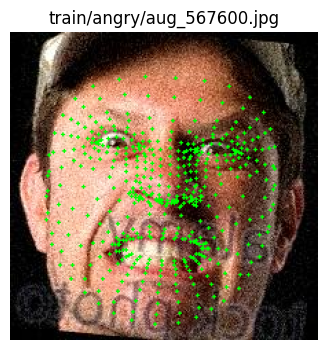

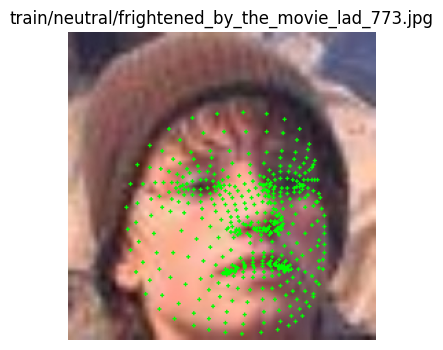

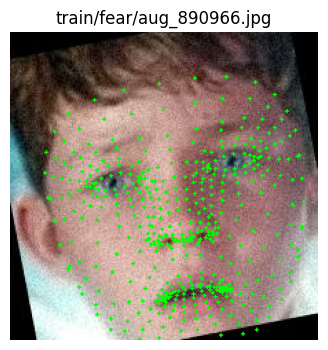

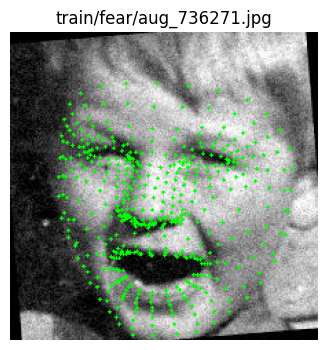

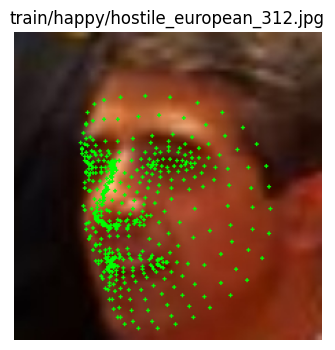

...

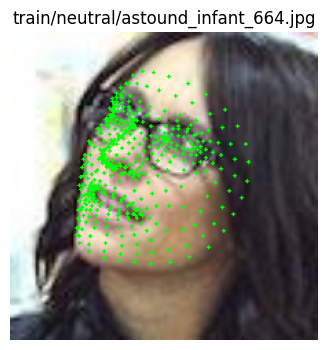

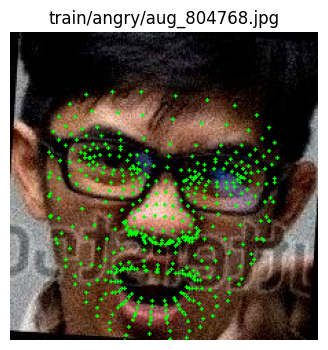

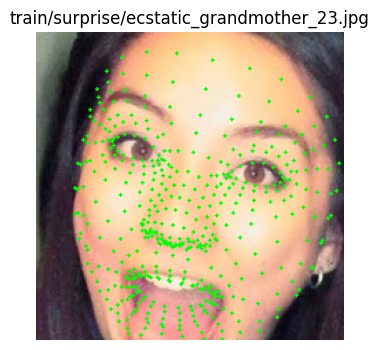

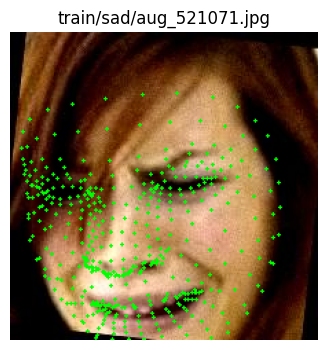

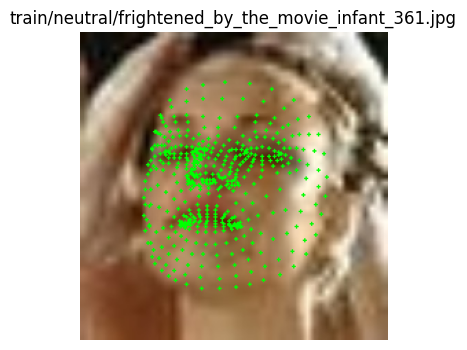


Showing landmarks for: VAL


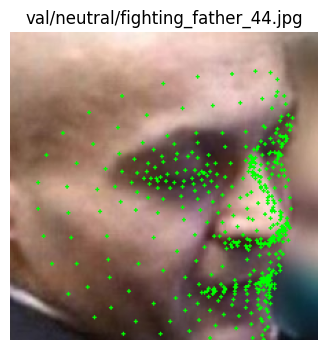

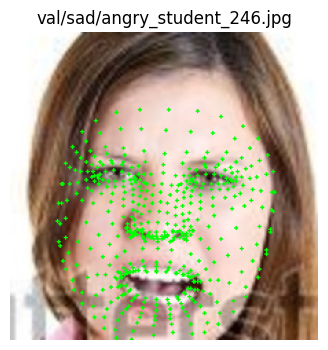

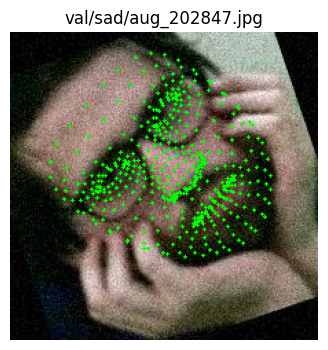

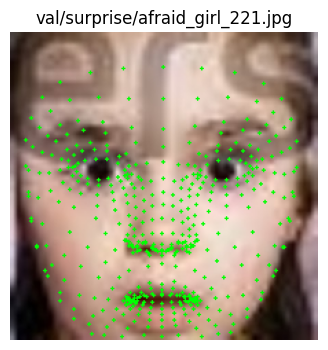

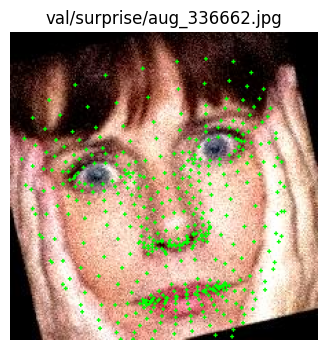

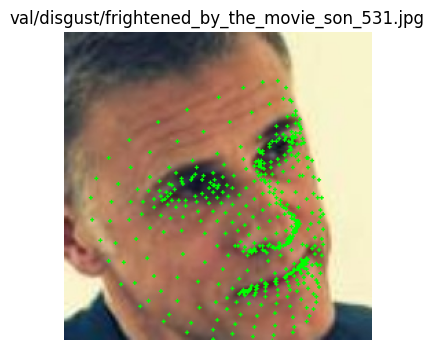

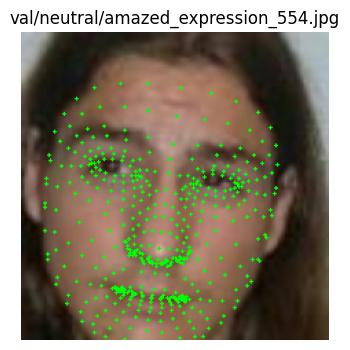

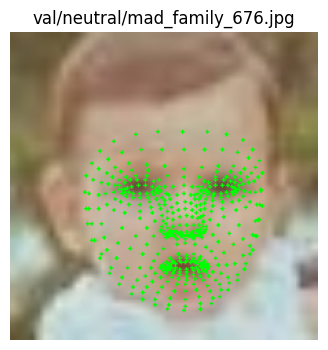

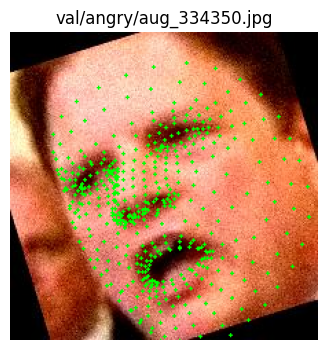

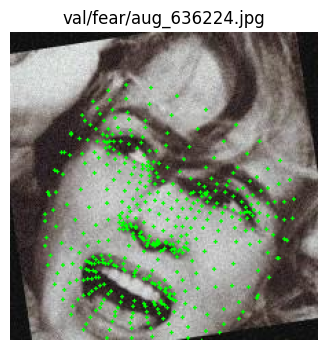


Showing landmarks for: TEST


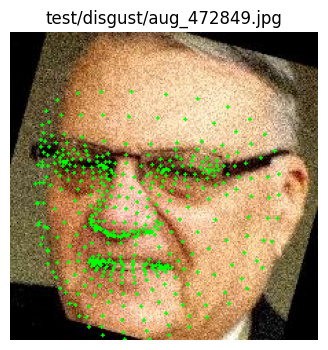

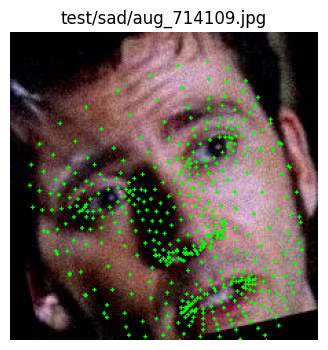

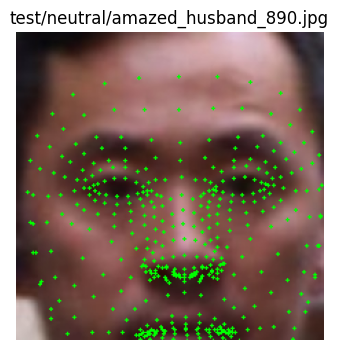

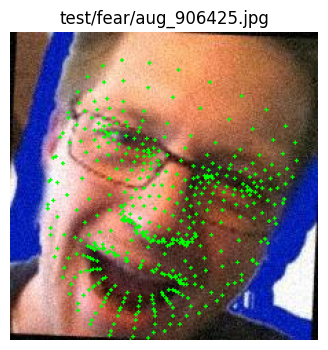

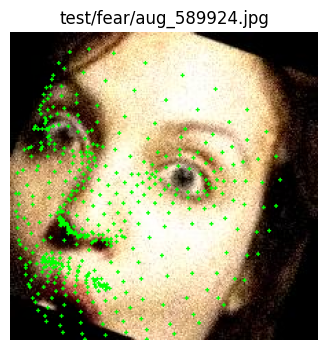

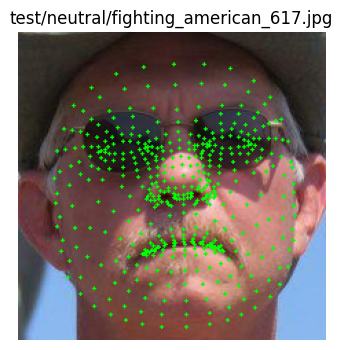

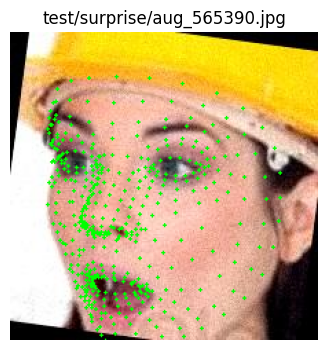

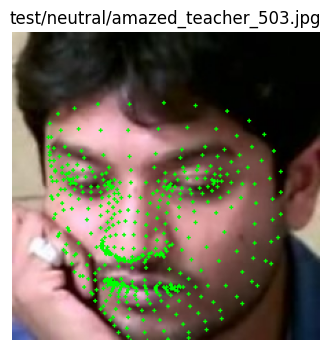

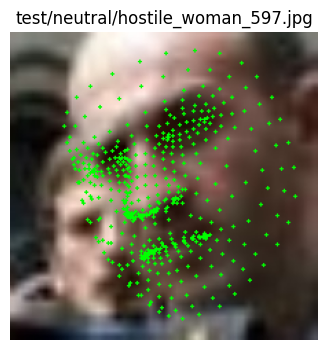

In [35]:
images_base = r"D:\ExpW_dataset\images_cropped_224"
landmarks_base = r"D:\ExpW_dataset\landmarks"

# How many to visualize
counts = {"train": 30, "val": 10, "test": 10}

def plot_landmarks_on_image(image_path, landmark_path):
    image = cv2.imread(image_path)
    if image is None or not os.path.exists(landmark_path):
        return None
    
    landmarks = np.load(landmark_path)
    h, w, _ = image.shape
    for x, y, _ in landmarks:
        px, py = int(x * w), int(y * h)
        cv2.circle(image, (px, py), 1, (0, 255, 0), -1)

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

for split, count in counts.items():
    print(f"\nShowing landmarks for: {split.upper()}")
    all_images = []
    split_path = os.path.join(images_base, split)

    for emotion in os.listdir(split_path):
        emotion_folder = os.path.join(split_path, emotion)
        image_files = glob(os.path.join(emotion_folder, "*.jpg"))
        all_images.extend(image_files)

    sampled = random.sample(all_images, min(count, len(all_images)))

    for img_path in sampled:
        emotion = os.path.basename(os.path.dirname(img_path))
        filename_wo_ext = os.path.splitext(os.path.basename(img_path))[0]
        landmark_path = os.path.join(landmarks_base, split, emotion, filename_wo_ext + ".npy")

        result_img = plot_landmarks_on_image(img_path, landmark_path)
        if result_img is not None:
            plt.figure(figsize=(4, 4))
            plt.imshow(result_img)
            plt.title(f"{split}/{emotion}/{os.path.basename(img_path)}")
            plt.axis('off')
            plt.show()

### **Deleting images which dont have landmarks**

In [4]:
def clean_unmatched_images(image_root, landmark_root):
    sets = ['train', 'val', 'test']
    deleted_count = 0

    for set_name in sets:
        image_set_dir = os.path.join(image_root, set_name)
        landmark_set_dir = os.path.join(landmark_root, set_name)

        print(f"\n🔍 Checking set: {set_name}")
        for emotion in os.listdir(image_set_dir):
            emotion_image_dir = os.path.join(image_set_dir, emotion)
            emotion_landmark_dir = os.path.join(landmark_set_dir, emotion)

            if not os.path.exists(emotion_landmark_dir):
                print(f"⚠️ Landmark folder missing: {emotion_landmark_dir}, skipping.")
                continue

            for fname in os.listdir(emotion_image_dir):
                if not fname.lower().endswith((".jpg", ".png")):
                    continue

                landmark_filename = fname.replace(".jpg", ".npy").replace(".png", ".npy")
                landmark_path = os.path.join(emotion_landmark_dir, landmark_filename)

                if not os.path.exists(landmark_path):
                    image_path = os.path.join(emotion_image_dir, fname)
                    os.remove(image_path)
                    deleted_count += 1
                    print(f"🗑️ Deleted: {image_path} (no corresponding landmark)")

    print(f"\n✅ Cleanup complete. Total images deleted: {deleted_count}")

# Example usage
clean_unmatched_images(
    image_root=r'D:\ExpW_dataset\images_cropped_224',
    landmark_root=r'D:\ExpW_dataset\landmarks'
)


🔍 Checking set: train
🗑️ Deleted: D:\ExpW_dataset\images_cropped_224\train\angry\amazed_actor_245.jpg (no corresponding landmark)
🗑️ Deleted: D:\ExpW_dataset\images_cropped_224\train\angry\amazed_american_27.jpg (no corresponding landmark)
🗑️ Deleted: D:\ExpW_dataset\images_cropped_224\train\angry\amazed_american_281.jpg (no corresponding landmark)
🗑️ Deleted: D:\ExpW_dataset\images_cropped_224\train\angry\amazed_american_72.jpg (no corresponding landmark)
🗑️ Deleted: D:\ExpW_dataset\images_cropped_224\train\angry\amazed_black_49.jpg (no corresponding landmark)
🗑️ Deleted: D:\ExpW_dataset\images_cropped_224\train\angry\amazed_boss_412.jpg (no corresponding landmark)
🗑️ Deleted: D:\ExpW_dataset\images_cropped_224\train\angry\amazed_european_495.jpg (no corresponding landmark)
🗑️ Deleted: D:\ExpW_dataset\images_cropped_224\train\angry\amazed_european_951.jpg (no corresponding landmark)
🗑️ Deleted: D:\ExpW_dataset\images_cropped_224\train\angry\amazed_father_558.jpg (no corresponding lan